<a href="https://colab.research.google.com/github/drSever/drSever_data_science/blob/main/Learning_projects_dl/project_10/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Задача

В этом проекте предлагается перенестись в 2016 год с технологиями 2021-2022 года и разработать мобильное приложение, похожее на Prisma.

Я - молодой энергичный стартапер, и мне придётся делать всё сразу, пока мой напарник будет искать инвестиции, продумывать бизнес-план и т. д. Средств на оплату серверов у нас нет, поэтому мы решаем проводить все вычисления модели на устройстве.

**Задача** — обучить модель, оптимизировать её и импортировать веса в приложение.

**ЦЕЛЬ ПРОЕКТА**
- создать правдоподобный прототип работающей модели переноса стиля.
- мобильное приложение или другой прототип, реализующий функцию, а также демонстрация его работы.

# Решение

На данном этапе будут получены модели для реализации переноса стиля на мобильном устройстве, а также будет проведен их инференс.

В учебном материале курса подробно расписаны этапы проекта и предоставлена [ссылка](https://github.com/magenta/magenta/tree/main/magenta/models/arbitrary_image_stylization#training-a-model) на репозиторий Magenta с подробной инструкцией. Проблема заключается в том, что предоставленный репозиторий не поддерживается, при попытке установки в окружение своего или облачного ресурса возникают множественные конфликты. В Google Colab запустить нативно его также не удалось, только через *miniconda*, однако даже в этом случае возникают проблемы.    
         
К счастью, в курсе имеется [ссылка](https://github.com/sayakpaul/Adventures-in-TensorFlow-Lite/blob/master/Magenta_arbitrary_style_transfer_model_conversion.ipynb) на второй вариант выполнения данного проекта в Google Colab. К сожалению, подробной инструкции нет и для решения пришлось немного поправить код, однако данный вариант решения у меня получился.

***Использованные материалы:***
- [Magenta arbitrary style transfer model conversion](https://github.com/sayakpaul/Adventures-in-TensorFlow-Lite/blob/master/Magenta_arbitrary_style_transfer_model_conversion.ipynb)
- [Style Transfer Demo - Dynamic Shape](https://colab.research.google.com/github/sayakpaul/Adventures-in-TensorFlow-Lite/blob/master/Style_Transfer_Demo_InceptionV3_Dynamic_Shape.ipynb#scrollTo=lUDZZN7Gxaz3)
- [Quantization Aware Training. Или как правильно использовать fp16 inference в TensorRT](https://habr.com/ru/articles/558406/)
- [https://github.com/DKudryavtsev](https://github.com/DKudryavtsev/Skillfactory-CV/tree/master/CV_Project4-StyleTransfer)
- [https://github.com/tensorflow/examples](https://github.com/tensorflow/examples)

## Подготовительный этап

Выполним аутентификацию (необходима для загрузки файлов моделей из непубличного хранилища GCS Bucket) и подключим Google Drive.

In [1]:
# Аутентификация
from google.colab import auth as google_auth, drive
google_auth.authenticate_user()

In [2]:
# подключаем google-диск
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Каталог для сохранения моделей:

In [3]:
output_dir = "/content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/models/"

Устанавливаем последний ***tensorflow***, если установленная версия не `*-dev*`, то может потребоваться перезапуск среды выполнения. В этом случае необходима повторная аутентификация выше.

In [4]:
# Установка TensorFlow
!pip uninstall -q -y tensorflow
!pip install -q tf-nightly

import tensorflow as tf
print(tf.__version__)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 604.5/604.5 MB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 85.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 60.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 83.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 60.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 32.8 MB/s eta 0:00:00
2.18.0-dev20240611


In [5]:
# импортируем оставшиеся библиотеки
from IPython.display import clear_output
from IPython.display import display
import ipywidgets as widgets
from PIL import Image
import numpy as np
import io
import os
import matplotlib.pyplot as plt

## Основа сети

Получим предобученную сеть ***InceptionV3, alpha=1*** из хранилища (так и не смог получить либо найти предобученную ***MobileNetV2***):

In [ ]:
model_type = 'original'

style_predict_network = 'gs://mobile-ml-wg/arbitrary_style_transfer/{}/SavedModel/predict'.format(model_type)
style_transform_network = 'gs://mobile-ml-wg/arbitrary_style_transfer/{}/SavedModel/transfer'.format(model_type)

## Квантование динамического диапазона

По сути, мы снижаем точность нейросети, переводя значения весов из float32 в float16 и int8, что приведет к небольшой (относительно) потери точности предсказаний, однако ускорит инференс, что особенно актуально для мобильный платформ.

In [ ]:
# Dynamic range quantization
def convert_tflite_model_dynamic(saved_model_path, tflite_path, type='style_predict'):
    """
    Функция принимает на вход путь к сохраненной модели, конвертирует модель в TensorFlow Lite format
    """
    model = tf.saved_model.load(saved_model_path) # загружаем модель по указанному пути
    concrete_func = model.signatures[
        tf.saved_model.DEFAULT_SERVING_SIGNATURE_DEF_KEY] # сигнатуры модели (по умолчанию в данном случае)
    print(concrete_func.inputs)
    if type == 'style_predict':
        concrete_func.inputs[0].set_shape([1, 256, 256, 3]) # update размерности тензора

    # if you'd prefer static shape in your models just uncomment this block
    else:
       for input in concrete_func.inputs:
           if input.name == 'content_image:0':
               input.set_shape([1, 384, 384, 3])
           elif input.name == 'Conv/BiasAdd:0':
               input.set_shape([1, 1, 1, 100])

    # конвертируем используя TFLiteConverter из конкретных функций
    converter = tf.lite.TFLiteConverter.from_concrete_functions([concrete_func])
    converter.optimizations = [tf.lite.Optimize.DEFAULT]

    tflite_model = converter.convert()

    with tf.io.gfile.GFile(tflite_path, 'wb') as f:
        f.write(tflite_model)

    print('Quantized model:', tflite_path,
        'Size:', len(tflite_model) / 1024, "kb")

Конвертируем в 2 сети следующих типов:

*   style_predict
*   style_transfer



In [ ]:
# Style predict network
convert_tflite_model_dynamic(style_predict_network, output_dir + 'style_predict_hybrid.tflite')

[<tf.Tensor 'style_image:0' shape=(None, None, None, 3) dtype=float32>]
Quantized model: /content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/models/style_predict_hybrid.tflite Size: 9000.96875 kb


Предупреждения можно игнорировать.

In [ ]:
# Style transfer network
convert_tflite_model_dynamic(style_transform_network, output_dir + 'style_transfer_hybrid.tflite', type='style_transfer')

[<tf.Tensor 'content_image:0' shape=(None, None, None, 3) dtype=float32>, <tf.Tensor 'Conv/BiasAdd:0' shape=(None, 1, 1, 100) dtype=float32>]
Quantized model: /content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/models/style_transfer_hybrid.tflite Size: 2022.75 kb


## Float16 квантование

In [ ]:
# Float16 quantization
def convert_tflite_model_dynamic(saved_model_path, tflite_path, type='style_predict'):
    """
    Функция принимает на вход путь к сохраненной модели, конвертирует модель в TensorFlow Lite format
    """
    model = tf.saved_model.load(saved_model_path)
    concrete_func = model.signatures[
        tf.saved_model.DEFAULT_SERVING_SIGNATURE_DEF_KEY]
    print(concrete_func.inputs)
    if type == 'style_predict':
        concrete_func.inputs[0].set_shape([1, 256, 256, 3])
    else:
        for input in concrete_func.inputs:
            if input.name == 'content_image:0':
                input.set_shape([1, 384, 384, 3])
            elif input.name == 'Conv/BiasAdd:0':
                input.set_shape([1, 1, 1, 100])

    converter = tf.lite.TFLiteConverter.from_concrete_functions([concrete_func])
    converter.optimizations = [tf.lite.Optimize.DEFAULT]
    converter.target_spec.supported_types = [tf.float16] # float16
    tflite_model = converter.convert()

    with tf.io.gfile.GFile(tflite_path, 'wb') as f:
        f.write(tflite_model)

    print('Quantized model:', tflite_path,
        'Size:', len(tflite_model) / 1024, "kb")

We are **not** going with dynamic shapes in case of this quantization scheme since TF Lite GPU delegate does not yet support that.

In [ ]:
# Style predict network
convert_tflite_model_dynamic(style_predict_network, output_dir + 'style_predict_f16.tflite')

[<tf.Tensor 'style_image:0' shape=(None, None, None, 3) dtype=float32>]
Quantized model: /content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/models/style_predict_f16.tflite Size: 17695.75 kb


In [ ]:
# Style transfer network
convert_tflite_model_dynamic(style_transform_network, output_dir + 'style_transfer_f16.tflite', type='style_transfer')

[<tf.Tensor 'content_image:0' shape=(None, None, None, 3) dtype=float32>, <tf.Tensor 'Conv/BiasAdd:0' shape=(None, 1, 1, 100) dtype=float32>]
Quantized model: /content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/models/style_transfer_f16.tflite Size: 3876.15234375 kb


## Int8 квантование (требуется репрезентативный датасет)

In [ ]:
def parse_function(image_size, raw_image_key_name):
  """Функция для парсинга обучающего набора данных TFRecord.
  Читает пример изображение и изменяет его размер до нужного.
  Args:
    image_size: int, целевой размер изображения
    raw_image_key_name: str, имя JPEG-изображения в каждой записи TFRecord
  Returns:
    Функция map для использования с tf.data.Dataset.map().
  """

  def func(example_proto):
    """Генератор, который будет использоваться в качестве representative_dataset для TFLiteConverter."""
    image_raw = tf.io.parse_single_example(
        example_proto,
        features={raw_image_key_name: tf.io.FixedLenFeature([], tf.string)},
    )
    image = tf.image.decode_jpeg(image_raw[raw_image_key_name])
    image = tf.expand_dims(image, axis=0)
    image = tf.image.resize(image, (image_size, image_size)) # bilinear is default
    image = tf.squeeze(image, axis=0)
    image = image / 255.0
    return image

  return func

In [ ]:
def rgb_filter_function(image):
  """Функция фильтра, пропускающая только RGB-изображения.
  Args:
    image: Tensor, проверяемый тензор изображения.
  Returns: bool, сохранить изображение или нет.
  """
  shape = tf.shape(image)[2]
  return tf.math.equal(shape, 3)

In [ ]:
def get_calibration_dataset(style_image_size, style_dataset_file,
                            content_image_size, imagenet_data_dir):
  """Функция создает калибровочный набор данных из обучающего набора данных.
  Args:
    style_image_size: int, размер изображения для изменения размера изображений стиля.
    style_dataset_file: str, путь к файлу TFRecord с изображениями стилей.
    content_image_size: int, размер изображения для изменения размера учебных изображений.
    imagenet_data_dir: str, путь к данным ImageNet.
  Returns:
    (str, str) Путь к набору данных стилей и набору данных для калибровки.
  """

  # Load style dataset
  style_dataset = tf.data.TFRecordDataset(style_dataset_file)
  style_dataset = style_dataset.map(parse_function(style_image_size, 'image_raw'), # parse_function
                                    num_parallel_calls= \
                                    tf.data.experimental.AUTOTUNE)
  style_dataset = style_dataset.filter(rgb_filter_function) # rgb_filter_function

  # Load content dataset
  tf_record_pattern = os.path.join(imagenet_data_dir, '%s-*' % 'train')
  data_files = tf.io.gfile.glob(tf_record_pattern)
  content_dataset = tf.data.TFRecordDataset(data_files)
  content_dataset = content_dataset.map(
      parse_function(content_image_size, 'image/encoded')) # parse_function
  content_dataset = content_dataset.filter(rgb_filter_function) # rgb_filter_function

  return style_dataset, content_dataset

Создаем датасеты стиля и данных для калибровки:

In [ ]:
# Create the datasets
style_dataset, content_dataset = get_calibration_dataset(256, 'gs://mobile-ml-wg/tfrecord/style_images/style_images.tfrecord',
    384, 'gs://mobile-ml-wg/tfrecord/imagenet2012/')

Визуализируем изображения из созданных датасетов:

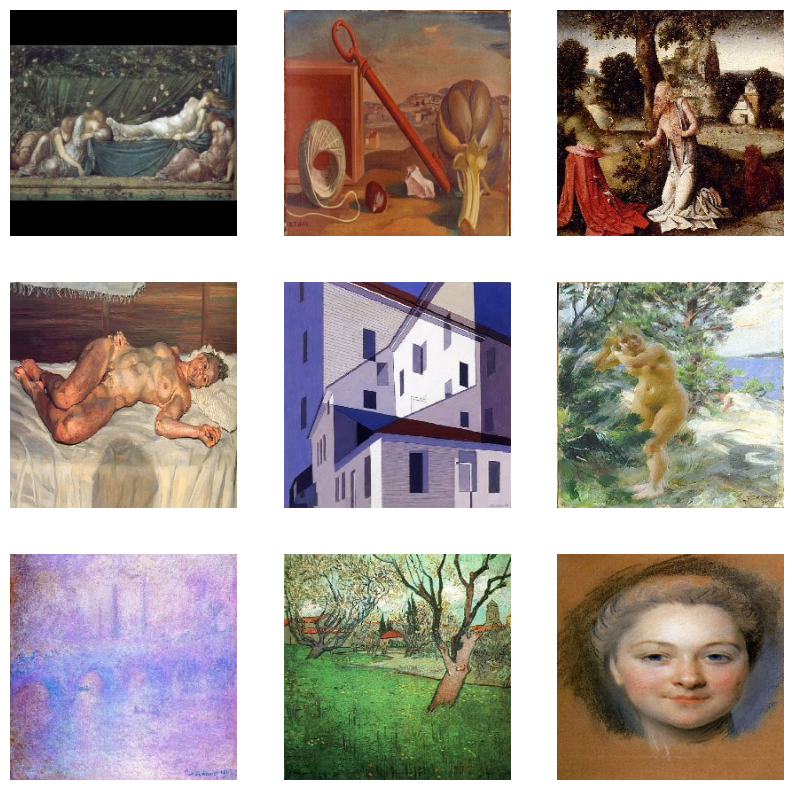

In [ ]:
# Visualize the style images
plt.figure(figsize=(10, 10))
for i, image in enumerate(style_dataset.take(9)):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image)
  plt.axis('off')

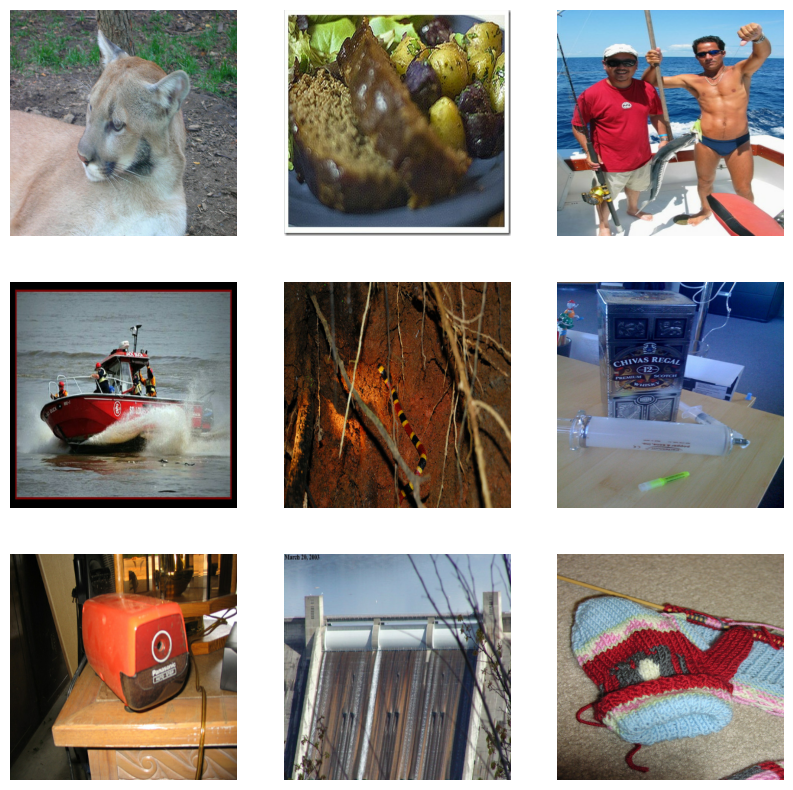

In [ ]:
# Visualize the content images
plt.figure(figsize=(10, 10))
for i, image in enumerate(content_dataset.take(9)):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image)
  plt.axis('off')

### Проверка графов сохраненных моделей

In [ ]:
style_predict_graph = tf.saved_model.load(style_predict_network)
style_concrete_func = style_predict_graph.signatures['serving_default']
style_concrete_func.structured_outputs

{'style_bottleneck': <tf.Tensor 'Conv/BiasAdd:0' shape=(None, 1, 1, 100) dtype=float32>}

In [ ]:
style_transform_graph = tf.saved_model.load(style_transform_network)
transform_func = style_transform_graph.signatures['serving_default']
transform_func.structured_outputs

{'stylized_image': <tf.Tensor 'transformer/expand/conv3/conv/Sigmoid:0' shape=(None, None, None, 3) dtype=float32>}

In [ ]:
print(style_concrete_func.inputs)
print(transform_func.inputs)

[<tf.Tensor 'style_image:0' shape=(None, None, None, 3) dtype=float32>]
[<tf.Tensor 'content_image:0' shape=(None, None, None, 3) dtype=float32>, <tf.Tensor 'Conv/BiasAdd:0' shape=(None, 1, 1, 100) dtype=float32>]


### Генераторы данных для репрезентативных наборов данных

In [ ]:
def style_images_rep():
    for image in style_dataset.take(10): # берем 10 изображений датасета стиля
        yield [tf.expand_dims(image, 0)] # добавляем ось по индексу 0 (батч)

In [ ]:
def calculate_style_bottleneck(concrete_fn, images):
    return concrete_fn(tf.constant(images))['style_bottleneck']

In [ ]:
def transfer_rep(content_image_index, bottleneck_index):
  def transfer_rep_gen():
    # создаем заполнители (placeholders) для репрезентативного набора данных
    representative_data = [None for i in range(len(transform_func.inputs))]

    # Get dummy style bottlenecks
    style_bottleneck_list = calculate_style_bottleneck(style_concrete_func,
                                                       next(iter(style_dataset.batch(10)))) # calculate_style_bottleneck

    for (i, content_image) in enumerate(content_dataset.take(10)):
        # построение репрезентативного набора данных
        representative_data[content_image_index] = tf.expand_dims(content_image, 0)
        representative_data[bottleneck_index] = tf.expand_dims(style_bottleneck_list[i], 0)

        # получение репрезентативного набора данных
        yield representative_data
  return transfer_rep_gen

In [ ]:
# Int8 quantization
def convert_tflite_model_dynamic(saved_model_path, tflite_path, type='style_predict'):
    model = tf.saved_model.load(saved_model_path)
    concrete_func = model.signatures[
        tf.saved_model.DEFAULT_SERVING_SIGNATURE_DEF_KEY]

    if type == 'style_predict':
        concrete_func.inputs[0].set_shape([1, 256, 256, 3])
    else:
        for index in range(len(concrete_func.inputs)):
            input = concrete_func.inputs[index]
            if input.name == 'content_image:0':
                input.set_shape([1, 384, 384, 3]) # For static shape
                content_image_index = index
            # elif input.name == 'Conv/BiasAdd:0':
            else:
                input.set_shape([1, 1, 1, 100]) # For static shape
                bottleneck_index = index

    converter = tf.lite.TFLiteConverter.from_concrete_functions([concrete_func])
    converter.optimizations = [tf.lite.Optimize.DEFAULT]

    if type == 'style_predict':
        converter.representative_dataset = style_images_rep # style_images_rep
    else:
        converter.representative_dataset = transfer_rep(content_image_index, bottleneck_index) # transfer_rep

    tflite_model = converter.convert()

    with tf.io.gfile.GFile(tflite_path, 'wb') as f:
        f.write(tflite_model)

    print('Quantized model:', tflite_path,
        'Size:', len(tflite_model) / 1024, "kb")

In [ ]:
# Style predict network
convert_tflite_model_dynamic(style_predict_network, output_dir + 'style_predict_int8.tflite')

/usr/local/lib/python3.10/dist-packages/tensorflow/lite/python/convert.py:983: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


Quantized model: /content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/models/style_predict_int8.tflite Size: 9115.359375 kb


In [ ]:
# Style transfer network
convert_tflite_model_dynamic(style_transform_network,
                             output_dir + 'style_transfer_int8.tflite', type='style_transfer')

Quantized model: /content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/models/style_transfer_int8.tflite Size: 2081.859375 kb


## Полученные TF Lite модели:


In [ ]:
!ls -1 {output_dir}

style_predict_f16.tflite
style_predict_hybrid.tflite
style_predict_int8.tflite
style_transfer_f16.tflite
style_transfer_hybrid.tflite
style_transfer_int8.tflite


# Инференс

Исходное изображение:

In [6]:
content_img_path = '/content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/images/content_cat.jpg'

Изображение стиля:

108525/108525 ━━━━━━━━━━━━━━━━━━━━ 0s 4us/step 


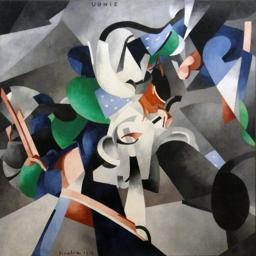

In [7]:
style_img = '/content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/images/style_udnie.jpg'
style_image_path = tf.keras.utils.get_file("style.jpg", 'file://' + style_img)

img_style = Image.open(style_img)
style_image = img_style
style_image = style_image.convert('RGB')
style_image.thumbnail((256, 256))
style_image.save('style_image.jpg')
image = Image.open('style_image.jpg')
display(image)

## Загрузка исходного изображения  

### Вариант самостоятельной загрузки исходного изображения:

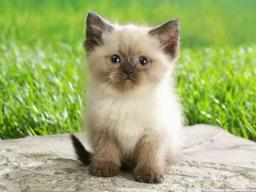

In [ ]:
clear_output()

def button_click(change):
    global content_image
    print('\n')
    img = Image.open(io.BytesIO(uploader.data[-1]))
    content_image = img
    img = img.convert('RGB')
    img.thumbnail((256, 256))
    img.save('thumbnail.jpg')
    image = Image.open('thumbnail.jpg')
    display(image)

uploader = widgets.FileUpload()
show_button = widgets.Button(description='Show image')
show_button.on_click(button_click)

widgets.VBox([widgets.Label('Upload a content image (must be an RGB or RGBA image). High-res images might take more time to be processed.'), uploader, show_button])

### Вариант загрузки указанного исходного изображения:

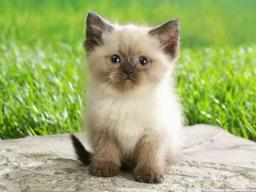

In [8]:
img = Image.open(content_img_path)
content_image = img
img = img.convert('RGB')
img.thumbnail((256, 256))
img.save('thumbnail.jpg')
image = Image.open('thumbnail.jpg')
display(image)

## Предобработка загруженного изображения

In [9]:
# Function to load an image from a file, and add a batch dimension.
def load_img(path_to_img):
  img = tf.io.read_file(path_to_img)
  img = tf.io.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)
  img = img[tf.newaxis, :]

  return img

# Function to load an image from a file, and add a batch dimension.
def load_content_img(image_pixels):
    if image_pixels.shape[-1] == 4:
        image_pixels = Image.fromarray(image_pixels)
        img = image_pixels.convert('RGB')
        img = np.array(img)
        img = tf.convert_to_tensor(img)
        img = tf.image.convert_image_dtype(img, tf.float32)
        img = img[tf.newaxis, :]
        return img
    elif image_pixels.shape[-1] == 3:
        img = tf.convert_to_tensor(image_pixels)
        img = tf.image.convert_image_dtype(img, tf.float32)
        img = img[tf.newaxis, :]
        return img
    elif image_pixels.shape[-1] == 1:
        raise Error('Grayscale images not supported! Please try with RGB or RGBA images.')
    print('Exception not thrown')

# Function to pre-process by resizing an central cropping it.
def preprocess_image(image, target_dim):
  # Resize the image so that the shorter dimension becomes 256px.
  shape = tf.cast(tf.shape(image)[1:-1], tf.float32)
  short_dim = min(shape)
  scale = target_dim / short_dim
  new_shape = tf.cast(shape * scale, tf.int32)
  image = tf.image.resize(image, new_shape)

  # Central crop the image.
  image = tf.image.resize_with_crop_or_pad(image, target_dim, target_dim)

  return image

# Convert the content image from Bytes to NumPy array.
content_image = np.array(content_image)

# Load the input images.
content_image = load_content_img(content_image)
style_image = load_img(style_image_path)

# Preprocess the input images.
preprocessed_content_image = preprocess_image(content_image, 384)
preprocessed_style_image = preprocess_image(style_image, 256)

print('Preprocessing the style and the content images...')
print('Style image shape:', preprocessed_style_image.shape)
print('Content image shape:', preprocessed_content_image.shape)

Preprocessing the style and the content images...
Style image shape: (1, 256, 256, 3)
Content image shape: (1, 384, 384, 3)


## Загрузка сохраненных моделей TF Lite:

In [10]:
style_predict_path = tf.keras.utils.get_file('style_predict.tflite', 'file://' + output_dir + 'style_predict_int8.tflite')
style_transform_path = tf.keras.utils.get_file('style_transform.tflite', 'file://' + output_dir + 'style_transfer_int8.tflite')

9334128/9334128 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
2131824/2131824 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step   


Calculating style bottleneck...
Style Bottleneck Shape: (1, 1, 1, 100)
Stylizing image. It should not take more than three minutes...


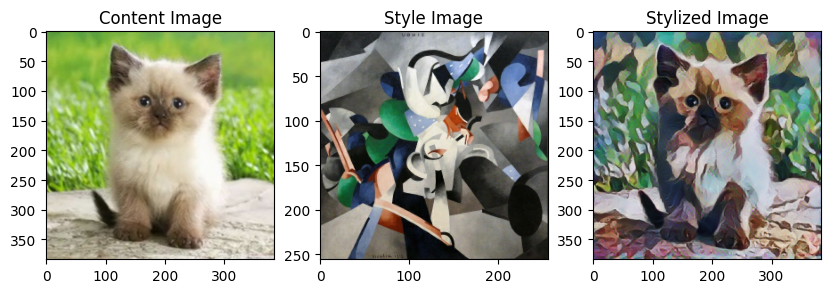

In [11]:
#@title Стилизация изображения (интерактивный вариант)

content_blending_ratio = 0.2 #@param {type:"slider", min:0, max:1, step:0.1}
#@markdown You're encouraged to play with the different values of `content_blending_ratio`.

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
imshow(preprocessed_content_image, 'Content Image')

plt.subplot(1, 3, 2)
imshow(preprocessed_style_image, 'Style Image')

# Function to run style prediction on preprocessed style image.
def run_style_predict(preprocessed_style_image):
  # Load the model.
  interpreter = tf.lite.Interpreter(model_path=style_predict_path)

  # Set model input.
  interpreter.allocate_tensors()
  input_details = interpreter.get_input_details()
  interpreter.set_tensor(input_details[0]["index"], preprocessed_style_image)

  # Calculate style bottleneck.
  interpreter.invoke()
  style_bottleneck = interpreter.tensor(
      interpreter.get_output_details()[0]["index"]
      )()

  return style_bottleneck

# Calculate style bottleneck for the preprocessed style image.
print('Calculating style bottleneck...')
style_bottleneck = run_style_predict(preprocessed_style_image)
print('Style Bottleneck Shape:', style_bottleneck.shape)
print('Stylizing image. It should not take more than three minutes...')

# Run style transform on preprocessed style image
def run_style_transform(style_bottleneck, preprocessed_content_image):
  # Load the model.
  interpreter = tf.lite.Interpreter(model_path=style_transform_path)

  # Set model input.
  input_details = interpreter.get_input_details()
  interpreter.allocate_tensors()

  # Set model inputs.
  for index in range(len(input_details)):
    if input_details[index]["name"]=='Conv/BiasAdd':
      interpreter.set_tensor(input_details[index]["index"], style_bottleneck)
    elif input_details[index]["name"]=='content_image':
      interpreter.set_tensor(input_details[index]["index"], preprocessed_content_image)
  interpreter.invoke()

  # Transform content image.
  stylized_image = interpreter.tensor(
      interpreter.get_output_details()[0]["index"]
      )()

  return stylized_image

# Calculate style bottleneck of the content image.
style_bottleneck_content = run_style_predict(
    preprocess_image(content_image, 256)
)

# Blend the style bottleneck of style image and content image
style_bottleneck_blended = content_blending_ratio * style_bottleneck_content \
                           + (1 - content_blending_ratio) * style_bottleneck

# Stylize the content image using the style bottleneck.
stylized_image = run_style_transform(style_bottleneck_blended, preprocessed_content_image)

# Visualize the output.
plt.subplot(1, 3, 3)
imshow(stylized_image, 'Stylized Image')

## Стилизация изображения (с различным content_blending_ratio):

Отдельно пропишем функции:

In [12]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

In [13]:
# Function to run style prediction on preprocessed style image.
def run_style_predict(preprocessed_style_image):
  # Load the model.
  interpreter = tf.lite.Interpreter(model_path=style_predict_path)

  # Set model input.
  interpreter.allocate_tensors()
  input_details = interpreter.get_input_details()
  interpreter.set_tensor(input_details[0]["index"], preprocessed_style_image)

  # Calculate style bottleneck.
  interpreter.invoke()
  style_bottleneck = interpreter.tensor(
      interpreter.get_output_details()[0]["index"]
      )()

  return style_bottleneck

In [14]:
# Run style transform on preprocessed style image
def run_style_transform(style_bottleneck, preprocessed_content_image):
  # Load the model.
  interpreter = tf.lite.Interpreter(model_path=style_transform_path)

  # Set model input.
  input_details = interpreter.get_input_details()
  interpreter.allocate_tensors()

  # Set model inputs.
  for index in range(len(input_details)):
    if input_details[index]["name"]=='Conv/BiasAdd':
      interpreter.set_tensor(input_details[index]["index"], style_bottleneck)
    elif input_details[index]["name"]=='content_image':
      interpreter.set_tensor(input_details[index]["index"], preprocessed_content_image)
  interpreter.invoke()

  # Transform content image.
  stylized_image = interpreter.tensor(
      interpreter.get_output_details()[0]["index"]
      )()

  return stylized_image

Проведем стилизацию исходного изображения с различным content_blending_ratio

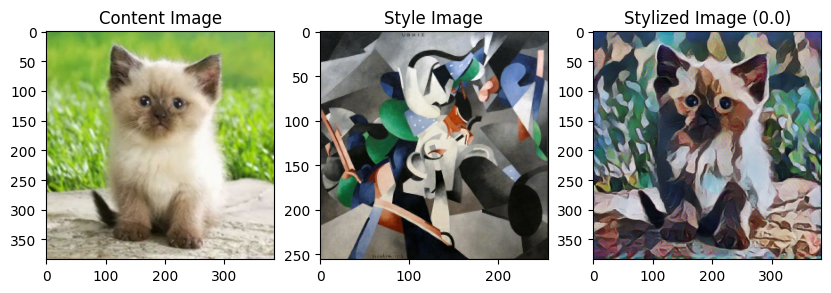

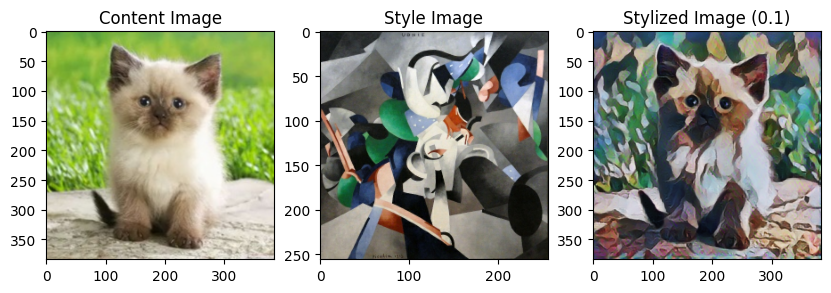

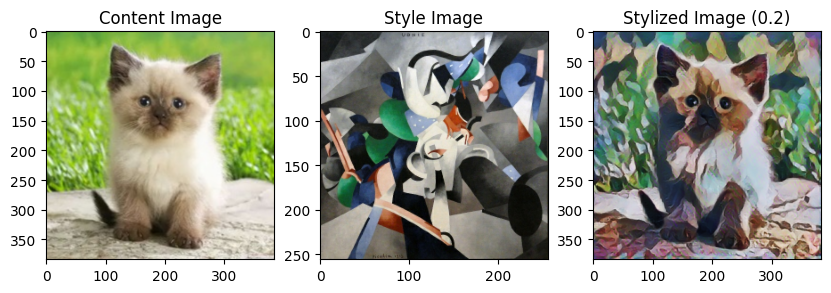

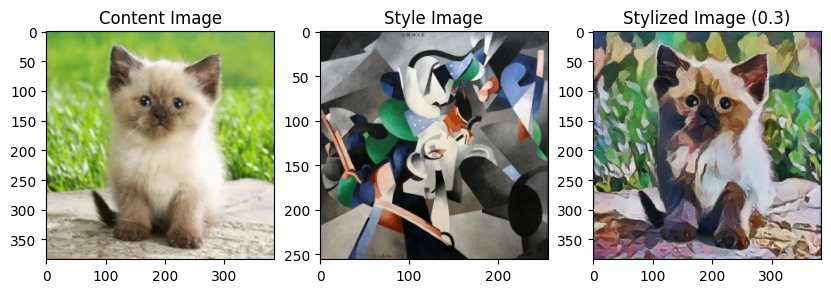

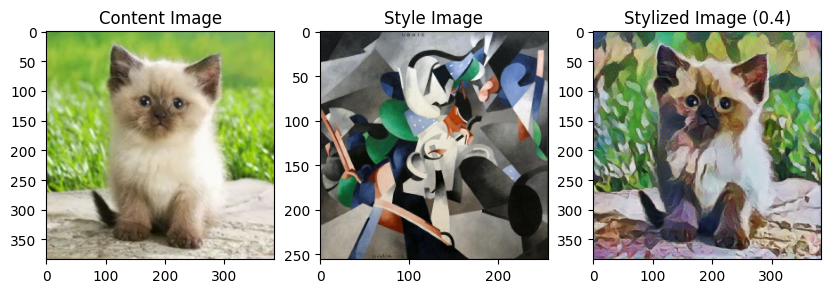

...

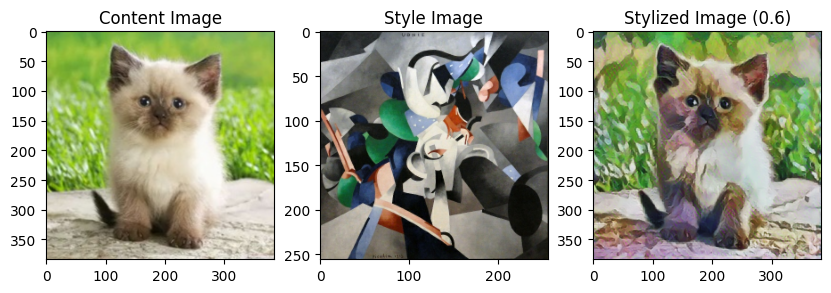

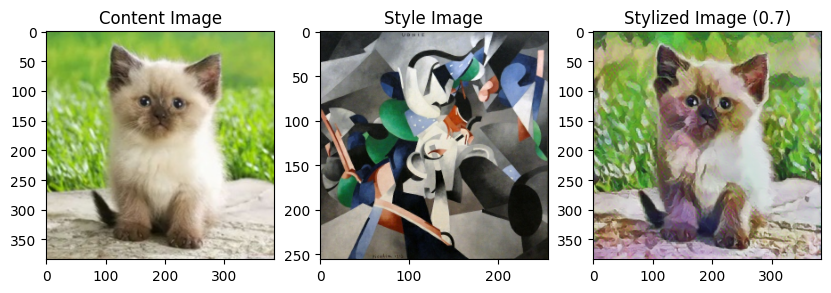

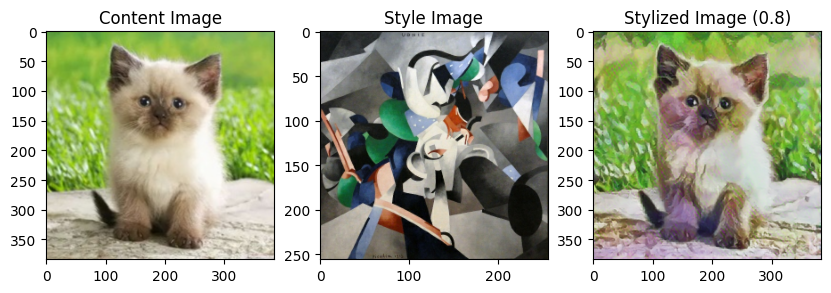

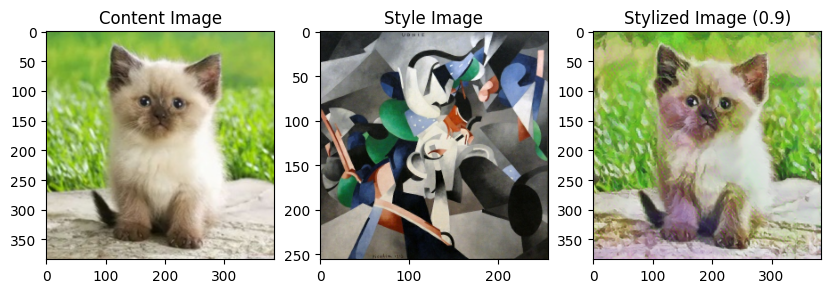

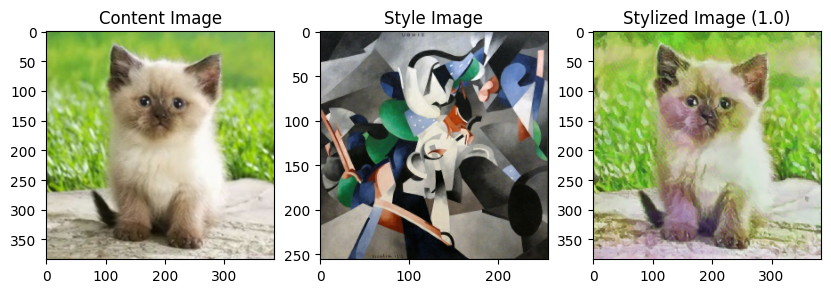

In [15]:
# Calculate style bottleneck for the preprocessed style image.
style_bottleneck = run_style_predict(preprocessed_style_image)

# Calculate style bottleneck of the content image.
style_bottleneck_content = run_style_predict(
    preprocess_image(content_image, 256)
)


for i in np.round(np.arange(0., 1.1, 0.1),1):

    content_blending_ratio = i

    plt.figure(figsize=(10, 10))

    plt.subplot(1, 3, 1)
    imshow(preprocessed_content_image, 'Content Image')

    plt.subplot(1, 3, 2)
    imshow(preprocessed_style_image, 'Style Image')

    # Blend the style bottleneck of style image and content image
    style_bottleneck_blended = content_blending_ratio * style_bottleneck_content \
                              + (1 - content_blending_ratio) * style_bottleneck

    # Stylize the content image using the style bottleneck.
    stylized_image = run_style_transform(style_bottleneck_blended, preprocessed_content_image)

    # Visualize the output.
    plt.subplot(1, 3, 3)
    imshow(stylized_image, f'Stylized Image ' + '(' + str(content_blending_ratio) + ')')

## Стилизация изображений из репозитория Magenta

In [16]:
path_content_images = '/content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/magenta_images/content_images/'
path_style_images = '/content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_4_v2/magenta_images/style_images/'

Исходные изображения:

In [17]:
!ls {path_content_images}

colva_beach_sq.jpg  eiffel_tower.jpg  golden_gate_sq.jpg  statue_of_liberty_sq.jpg


Выбираем исходное изображение:

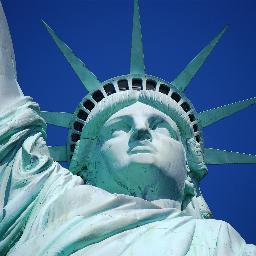

In [18]:
img = Image.open(path_content_images + 'statue_of_liberty_sq.jpg')
content_image = img
img = img.convert('RGB')
img.thumbnail((256, 256))
img.save('thumbnail.jpg')
image = Image.open('thumbnail.jpg')
display(image)

Изображения стиля:

In [19]:
!ls {path_style_images}

black_zigzag.jpg      clouds-over-bor-1940_sq.jpg   pink_zigzag.jpg	      towers_1916_sq.jpg
bricks_sq.jpg	      La_forma.jpg		    red_texture_sq.jpg	      zigzag_colorful.jpg
Camille_Mauclair.jpg  piano-keyboard-sketch_sq.jpg  Theo_van_Doesburg_sq.jpg


Выбираем изображение стиля:

31631/31631 ━━━━━━━━━━━━━━━━━━━━ 0s 7us/step 


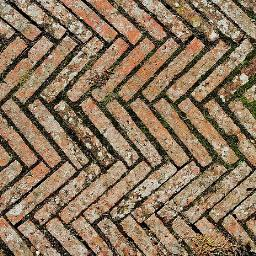

In [20]:
style_img = path_style_images + 'bricks_sq.jpg'
style_image_path = tf.keras.utils.get_file("style_2.jpg", 'file://' + style_img)

img_style = Image.open(style_img)
style_image = img_style
style_image = style_image.convert('RGB')
style_image.thumbnail((256, 256))
style_image.save('style_image.jpg')
image = Image.open('style_image.jpg')
display(image)

Предобработка изображений:

In [21]:
# Convert the content image from Bytes to NumPy array.
content_image = np.array(content_image)

# Load the input images.
content_image = load_content_img(content_image)
style_image = load_img(style_image_path)

# Preprocess the input images.
preprocessed_content_image = preprocess_image(content_image, 384)
preprocessed_style_image = preprocess_image(style_image, 256)

print('Preprocessing the style and the content images...')
print('Style image shape:', preprocessed_style_image.shape)
print('Content image shape:', preprocessed_content_image.shape)

Preprocessing the style and the content images...
Style image shape: (1, 256, 256, 3)
Content image shape: (1, 384, 384, 3)


Стилизация:

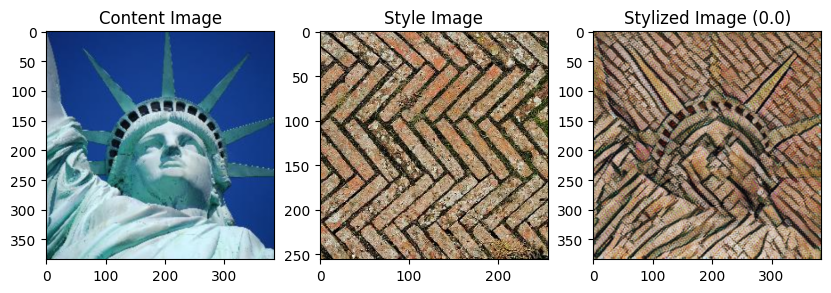

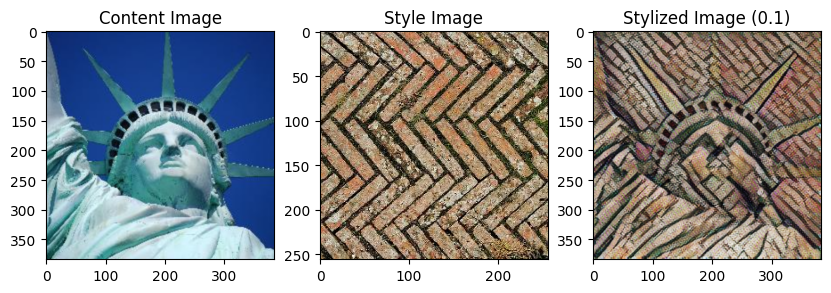

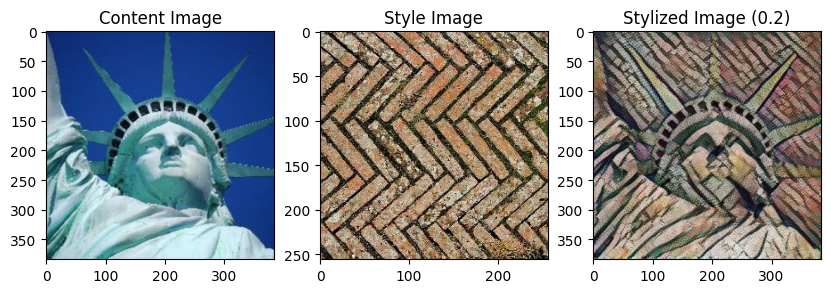

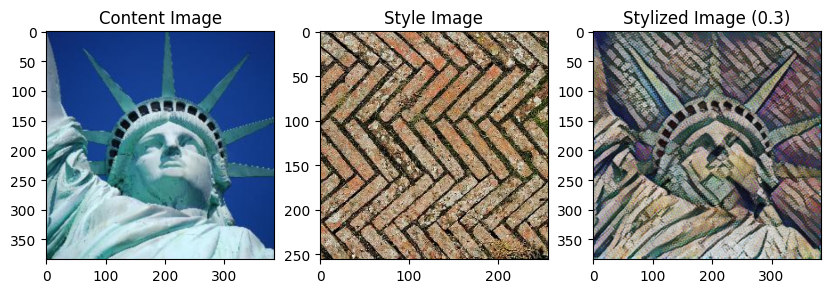

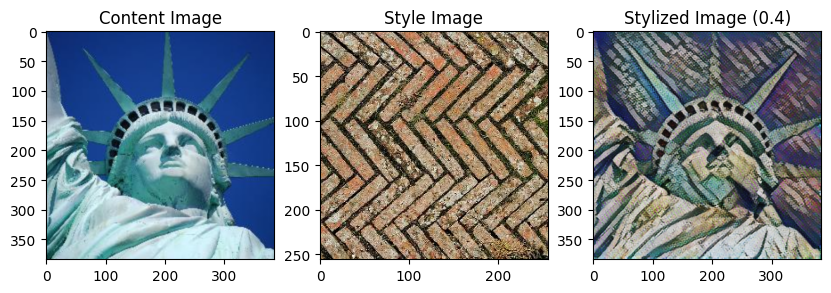

...

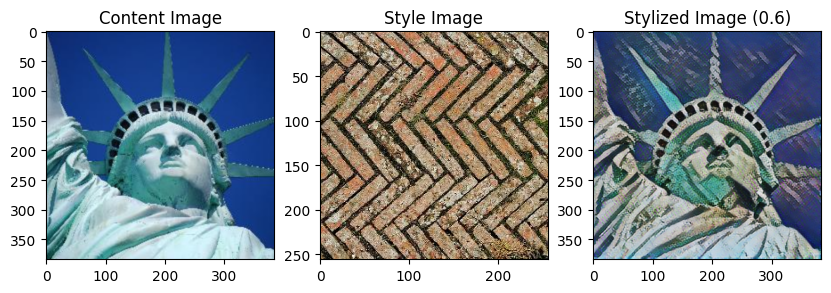

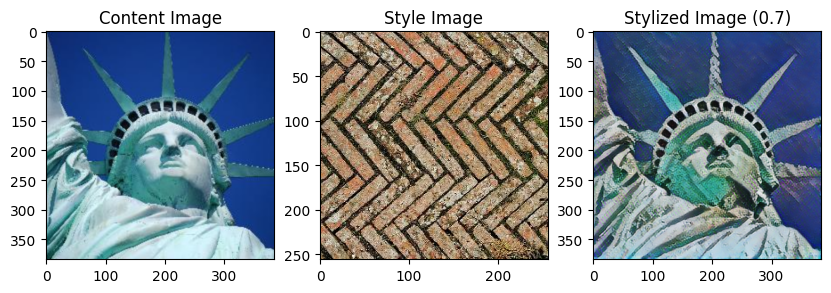

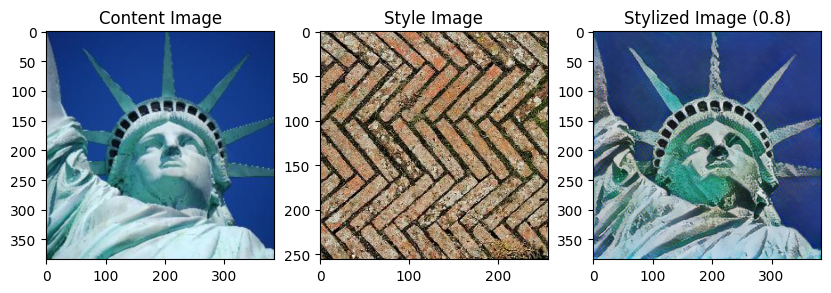

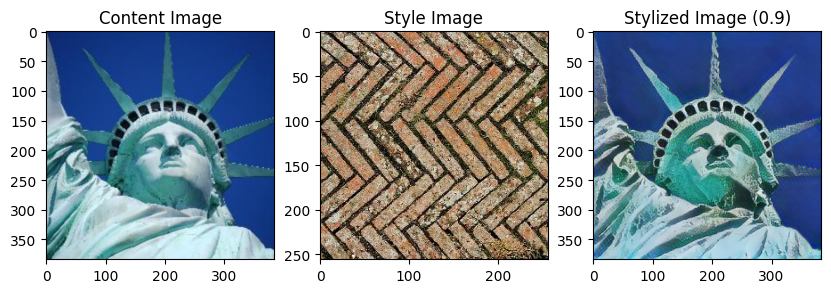

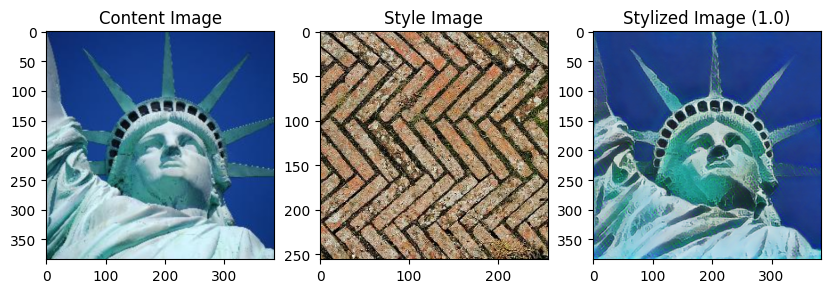

In [22]:
# Calculate style bottleneck for the preprocessed style image.
style_bottleneck = run_style_predict(preprocessed_style_image)

# Calculate style bottleneck of the content image.
style_bottleneck_content = run_style_predict(
    preprocess_image(content_image, 256)
)


for i in np.round(np.arange(0., 1.1, 0.1),1):

    content_blending_ratio = i

    plt.figure(figsize=(10, 10))

    plt.subplot(1, 3, 1)
    imshow(preprocessed_content_image, 'Content Image')

    plt.subplot(1, 3, 2)
    imshow(preprocessed_style_image, 'Style Image')

    # Blend the style bottleneck of style image and content image
    style_bottleneck_blended = content_blending_ratio * style_bottleneck_content \
                              + (1 - content_blending_ratio) * style_bottleneck

    # Stylize the content image using the style bottleneck.
    stylized_image = run_style_transform(style_bottleneck_blended, preprocessed_content_image)

    # Visualize the output.
    plt.subplot(1, 3, 3)
    imshow(stylized_image, f'Stylized Image ' + '(' + str(content_blending_ratio) + ')')

# Выводы

- получены модели для реализации переноса стиля на мобильном устройстве
- выполнен их инференс, в т.ч. на изображениях из репозитория Magenta
- к сожалению, задание было для меня самым сложным за все время обучения и я не могу сказать, что мне все ясно и понятно; вся работа делалась больше на основе поиска в гугле, методом тыка и интуиции.